In [232]:
import pandas as pd
import kagglehub
import numpy as np
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split

# Download latest version
path = kagglehub.dataset_download("paresh2047/uci-semcom")
secom=pd.read_csv(f"{path}/uci-secom.csv")


from streamlit_gsheets import GSheetsConnection
import streamlit as st
conn = st.connection("gsheets", type=GSheetsConnection)
secom = conn.read()

2024-12-30 01:18:28.350 No runtime found, using MemoryCacheStorageManager


In [233]:
print(secom.shape)


(1567, 592)


In [234]:
secom.columns

Index(['Time', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '581', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=592)

In [235]:
print(secom.describe)

<bound method NDFrame.describe of                      Time        0        1          2          3       4  \
0     2008-07-19 11:55:00  3030.93  2564.00  2187.7333  1411.1265  1.3602   
1     2008-07-19 12:32:00  3095.78  2465.14  2230.4222  1463.6606  0.8294   
2     2008-07-19 13:17:00  2932.61  2559.94  2186.4111  1698.0172  1.5102   
3     2008-07-19 14:43:00  2988.72  2479.90  2199.0333   909.7926  1.3204   
4     2008-07-19 15:22:00  3032.24  2502.87  2233.3667  1326.5200  1.5334   
...                   ...      ...      ...        ...        ...     ...   
1562  2008-10-16 15:13:00  2899.41  2464.36  2179.7333  3085.3781  1.4843   
1563  2008-10-16 20:49:00  3052.31  2522.55  2198.5667  1124.6595  0.8763   
1564   2008-10-17 5:26:00  2978.81  2379.78  2206.3000  1110.4967  0.8236   
1565   2008-10-17 6:01:00  2894.92  2532.01  2177.0333  1183.7287  1.5726   
1566   2008-10-17 6:07:00  2944.92  2450.76  2195.4444  2914.1792  1.5978   

          5         6       7       8  ..

In [236]:
print(secom.isnull().sum().sum())

41951


In [237]:
secom = secom.replace(np.nan, 0)


In [238]:
secom.isnull().any().any()

np.False_

In [239]:
yield_df = pd.DataFrame(secom['Pass/Fail'].value_counts()).reset_index()



pie_for_yield = px.pie(yield_df, values='count', names='Pass/Fail', title='Pass/Fail Distribution', color_discrete_map='Pastel')

pie_for_yield.update_traces(textposition='inside', textinfo='percent+label')
pie_for_yield.update_layout(showlegend=True)  # Enable the legend
pie_for_yield.show()

<Axes: >

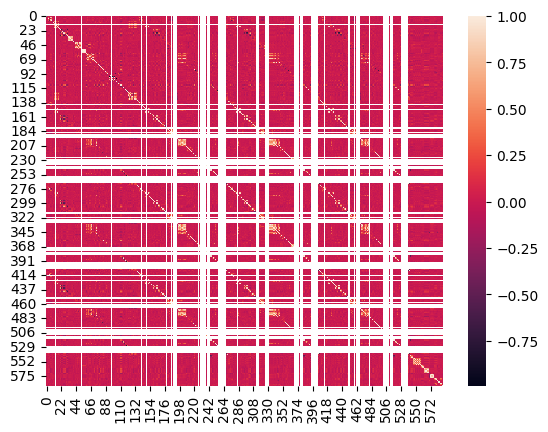

In [240]:
sns.heatmap(secom.iloc[:, 1:].corr())

In [241]:
px.imshow(secom.iloc[:, 1:].corr(),
          color_continuous_scale='blues')

In [242]:
all_zero_columns = secom.apply(lambda col: (col == 0 ).all())
# Get the names of the columns that are all zeros
columns_all_zero = all_zero_columns[all_zero_columns].index.tolist()
columns_all_zero

['13',
 '52',
 '97',
 '141',
 '149',
 '178',
 '179',
 '186',
 '189',
 '190',
 '191',
 '192',
 '193',
 '194',
 '226',
 '229',
 '230',
 '231',
 '232',
 '233',
 '234',
 '235',
 '236',
 '237',
 '240',
 '241',
 '242',
 '243',
 '256',
 '257',
 '258',
 '259',
 '260',
 '261',
 '262',
 '263',
 '264',
 '265',
 '266',
 '276',
 '284',
 '313',
 '314',
 '315',
 '322',
 '325',
 '326',
 '327',
 '328',
 '329',
 '330',
 '364',
 '369',
 '370',
 '371',
 '372',
 '373',
 '374',
 '375',
 '378',
 '379',
 '380',
 '381',
 '394',
 '395',
 '396',
 '397',
 '398',
 '399',
 '400',
 '401',
 '402',
 '403',
 '404',
 '414',
 '422',
 '449',
 '450',
 '451',
 '458',
 '461',
 '462',
 '463',
 '464',
 '465',
 '466',
 '481',
 '498',
 '501',
 '502',
 '503',
 '504',
 '505',
 '506',
 '507',
 '508',
 '509',
 '512',
 '513',
 '514',
 '515',
 '528',
 '529',
 '530',
 '531',
 '532',
 '533',
 '534',
 '535',
 '536',
 '537',
 '538']

In [243]:
secom_cleaned = pd.DataFrame(secom.loc[:, (secom != 0).any(axis=0)])

In [244]:
secom_cleaned.shape

(1567, 480)

<Axes: >

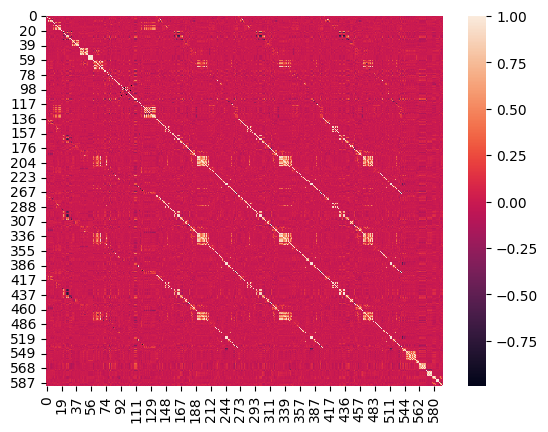

In [245]:
sns.heatmap(secom_cleaned.iloc[:,1:].corr())

In [246]:
# Calculate the correlation matrix
corr_matrix = secom_cleaned.iloc[:,1:].corr().abs()

# Select the upper triangle of the correlation matrix
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find columns with correlation greater than 0.7
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.7)]

# Drop those columns
secom_dropped = secom_cleaned.drop(columns=to_drop)

print(secom_dropped)


                     Time        0        1          2          3       4  \
0     2008-07-19 11:55:00  3030.93  2564.00  2187.7333  1411.1265  1.3602   
1     2008-07-19 12:32:00  3095.78  2465.14  2230.4222  1463.6606  0.8294   
2     2008-07-19 13:17:00  2932.61  2559.94  2186.4111  1698.0172  1.5102   
3     2008-07-19 14:43:00  2988.72  2479.90  2199.0333   909.7926  1.3204   
4     2008-07-19 15:22:00  3032.24  2502.87  2233.3667  1326.5200  1.5334   
...                   ...      ...      ...        ...        ...     ...   
1562  2008-10-16 15:13:00  2899.41  2464.36  2179.7333  3085.3781  1.4843   
1563  2008-10-16 20:49:00  3052.31  2522.55  2198.5667  1124.6595  0.8763   
1564   2008-10-17 5:26:00  2978.81  2379.78  2206.3000  1110.4967  0.8236   
1565   2008-10-17 6:01:00  2894.92  2532.01  2177.0333  1183.7287  1.5726   
1566   2008-10-17 6:07:00  2944.92  2450.76  2195.4444  2914.1792  1.5978   

           8       9      10      11  ...       570     571    572     578 

<Axes: >

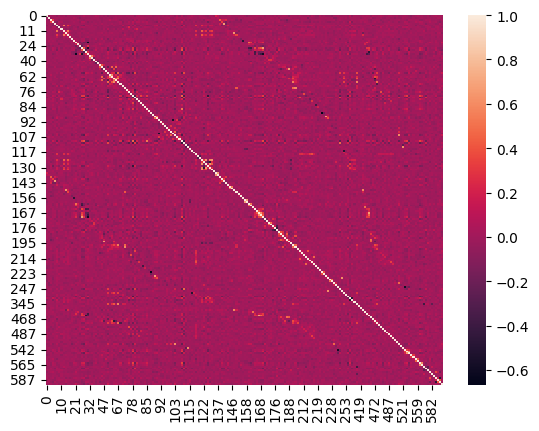

In [247]:
sns.heatmap(secom_dropped.iloc[:,1:].corr())

In [248]:
# Finally drop the timestamp column

secom_dropped = secom_dropped.iloc[:,1:] 

In [249]:
secom_dropped.shape

(1567, 195)

In [250]:
df_x = secom_dropped.iloc[:,:194]
df_y = secom_dropped['Pass/Fail']

In [251]:
df_x

,0,1,2,3,4,8,9,10,11,14,...,565,570,571,572,578,582,583,586,587,589
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,1.5005,0.0162,-0.0034,0.9455,7.9558,...,0.0000,533.8500,2.1113,8.95,0.0000,0.5005,0.0118,0.0000,0.0000,0.0000
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,1.4966,-0.0005,-0.0148,0.9627,10.1548,...,0.0000,535.0164,2.4335,5.92,0.0096,0.5019,0.0223,0.0096,0.0201,208.2045
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,1.4436,0.0041,0.0013,0.9615,9.5157,...,0.6219,535.0245,2.0293,11.21,0.0584,0.4958,0.0157,0.0584,0.0484,82.8602
3,2988.72,2479.90,2199.0333,909.7926,1.3204,1.4882,-0.0124,-0.0033,0.9629,9.6052,...,0.1630,530.5682,2.0253,9.33,0.0202,0.4990,0.0103,0.0202,0.0149,73.8432
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,1.5031,-0.0031,-0.0072,0.9569,10.5661,...,0.0000,532.0155,2.0275,8.83,0.0000,0.4800,0.4766,0.0202,0.0149,73.8432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,1.4843,1.3424,-0.0045,-0.0057,0.9579,11.7692,...,0.0877,536.3418,2.0153,7.98,0.0068,0.4988,0.0143,0.0068,0.0138,203.1720
1563,3052.31,2522.55,2198.5667,1124.6595,0.8763,1.4333,-0.0061,-0.0093,0.9618,9.1620,...,0.1308,537.9264,2.1814,5.48,0.0000,0.4975,0.0131,0.0068,0.0138,203.1720
1564,2978.81,2379.78,2206.3000,1110.4967,0.8236,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.2388,530.3709,2.3435,6.49,0.0197,0.4987,0.0153,0.0197,0.0086,43.5231
1565,2894.92,2532.01,2177.0333,1183.7287,1.5726,1.4622,-0.0072,0.0032,0.9694,9.7354,...,0.0877,534.3936,1.9098,9.13,0.0262,0.5004,0.0178,0.0262,0.0245,93.4941


In [253]:
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size=0.2, random_state=42)

In [272]:
dfs = {
    'x_train': x_train,
    'x_test': x_test,
    'y_train': y_train,
    'y_test': y_test
}

shapes_data = [(name, df.shape) for name, df in dfs.items()]
shapes_df = pd.DataFrame(shapes_data, columns=['DataFrame', 'Shape'])
    


In [273]:
shapes_df

,DataFrame,Shape
0,x_train,"(1253, 194)"
1,x_test,"(314, 194)"
2,y_train,"(1253,)"
3,y_test,"(314,)"
